# Nanostring

#### The output will have both the gene expression data and Protein markers saved in obs data. The protein markers are served as morphorlogy dataset. 
1. DAPI-for cell segmentation; 
2. Quality Control (QC)
You can use the protein signal in your obs to detect and remove errors:
Doublet Detection: If a single "cell" has high intensity for both PanCK (tumor) and CD3 (T-cell), it is likely a segmentation error where two cells were merged.
Background Noise: If a cell has high transcript counts but very low protein signal (low DAPI/Membrane stain), it might be an artifact or "cell-free" RNA.
3. Spatial Context & Neighborhoods
Proteins allow you to define the tissue architecture (the "where"):
Niche Mapping: You can define a "Tumor Niche" by cells high in PanCK protein or an "Immune Hub" by cells high in CD45.
Proximity Analysis: You can specifically study how gene expression (e.g., your 960 genes) changes in immune cells (CD45+) based on how close they are to the tumor boundary (PanCK+).

Summary of Differences
Feature 	Genes (n_vars)	                    Proteins (obs)
Function	Pathway analysis, state discovery.	Segmentation, architecture, QC.
Plex	    960+ targets (High plex).	        ~5 morphology markers (Low plex).
Data Type	Digital counts (RNA molecules).	    Fluorescence Intensity (Morphology).


Common CosMx Panel Sizes
1) 1k Human/Mouse Universal Cell Characterization (UCC) Panel: ~960-1000 targets. This tutorial is in this category.
2) 6k Discovery Panel: ~6,000 genes for deeper characterization.
3) WTX (Whole Transcriptome): ~18,000+ genes for unbiased.

The CosMx™ Human Universal Cell Characterization Panel includes 1000 targets covering cell types, cell states, and cell signaling across a variety of tissue types. Ten negative control targets are also included for analysis of results. The panel is configured as a 950-target core plus controls and includes a 50-target add-on that could be replaced with a custom add-on with targets of your choosing. The core 960 targets (950 genes and 10 controls) in the panel are covered by the CosMx Hs UCC RNA Probe Mix. The CosMx Hs UCC RNA Add-On (50) Probe Mix covers an additional 50 genes and can alternatively be replaced with a CosMx Custom Add-On panel of between 7-50 genes. Volume is for 4 slides and can be run in either a 2X2 or 1X4 Slide Run configuration.

The 980 variables in this dataset indicate that this specific run likely used the CosMx Human Universal Cell Characterization (UCC) Panel.

Transcriptomics vs. Multiomics: The CosMx platform can also perform simultaneous RNA and protein co-detection. If this were a protein-only run, you would typically see around 64–100 targets.

The 960-genes tell you what cells are doing (state/pathways), the protein markers tell you where the cells are and what they look like. DAPI image is used for cell-segmentation.

NOTE: there are proteins markers in the adata.obs. Those proteins (PanCK, CD45, CD3, DAPI) are your morphorlogy markers.

In [4]:
from pathlib import Path
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import squidpy as sq
import pandas as pd

sc.logging.print_header()

/tmp/ipykernel_145014/3475690570.py:11: RuntimeWarning: Failed to import dependencies for application/vnd.jupyter.widget-view+json representation. (ModuleNotFoundError: No module named 'ipywidgets')
  sc.logging.print_header()


Package,Version
numpy,2.3.5
matplotlib,3.10.8
seaborn,0.13.2
scanpy,1.11.5
squidpy,1.7.0
pandas,2.2.3
Component,Info
Python,"3.11.13 (main, Jun 5 2025, 13:12:00) [GCC 11.2.0]"
OS,Linux-3.10.0-1160.108.1.el7.x86_64-x86_64-with-glibc2.17
CPU,"16 logical CPU cores, x86_64"


In [6]:
# Force pandas to use plain object dtype strings everywhere
pd.options.mode.string_storage = 'python'  # instead of 'pyarrow'. Otherwise, the write_h5ad will get error.

nanostring_dir = Path().resolve()/"tutorial_data/"/"nanostring_data"
sample_dir = nanostring_dir /"Lung5_Rep2" /"Lung5_Rep2-Flat_files_and_images"

print(nanostring_dir)
print(sample_dir)


adata = sq.read.nanostring(
    path = sample_dir,
    counts_file = "Lung5_Rep2_exprMat_file.csv",
    meta_file = "Lung5_Rep2_metadata_file.csv",
    fov_file = "Lung5_Rep2_fov_positions_file.csv",
)


/stomics_data/liminData/spatial_related_codes/spatial_biology/CosMx_nanoString/tutorial_data/nanostring_data
/stomics_data/liminData/spatial_related_codes/spatial_biology/CosMx_nanoString/tutorial_data/nanostring_data/Lung5_Rep2/Lung5_Rep2-Flat_files_and_images


In [30]:
# CosMx has ~10 - 20 negative control. Count how many negative controls
adata.var_names.str.startswith("NegPrb").sum() # 20
print(type(adata.var_names)) # <class 'pandas.core.indexes.base.Index'>
print(type(adata.var_names.str))

"""  
<class 'pandas.core.indexes.base.Index'> -- The actual object that stores your labels (e.g., adata.var_names)
<class 'pandas.core.strings.accessor.StringMethods'> -- The utility interface (accessed via `.str`) that allows you to perform text.

"""

# Also
print(adata.var_names[945:981])

<class 'pandas.core.indexes.base.Index'>
<class 'pandas.core.strings.accessor.StringMethods'>
Index(['WNT11', 'WNT2', 'WNT2B', 'WNT3', 'WNT5A', 'WNT5B', 'WNT7A', 'WNT7B',
       'WNT9A', 'XBP1', 'XCL1', 'XCL2', 'YBX3', 'YES1', 'ZFP36', 'NegPrb3',
       'NegPrb5', 'NegPrb6', 'NegPrb7', 'NegPrb8', 'NegPrb9', 'NegPrb10',
       'NegPrb11', 'NegPrb12', 'NegPrb13', 'NegPrb14', 'NegPrb15', 'NegPrb16',
       'NegPrb17', 'NegPrb18', 'NegPrb19', 'NegPrb20', 'NegPrb21', 'NegPrb22',
       'NegPrb23'],
      dtype='object')


In [14]:
print(f"adata.obs.shape: {adata.shape}")
print(f"adata.X.shape: {adata.X.shape}")

adata

adata.obs.shape: (106660, 980)
adata.X.shape: (106660, 980)


AnnData object with n_obs × n_vars = 106660 × 980
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [11]:
print(type(adata.var.index._values))
adata.obs
adata.X.shape
adata.X

<class 'numpy.ndarray'>


<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 15022791 stored elements and shape (106660, 980)>

In [34]:
print(adata)
print(adata.obsm['spatial']) # the actual X/Y coordinates for the "centroids" of your cells 
print(adata.obsm['spatial_fov'])

AnnData object with n_obs × n_vars = 106660 × 980
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'
[[ 806 3628]
 [ 980 3630]
 [1637 3607]
 ...
 [3080   12]
 [4113   14]
 [1940   12]]
[[  8156.         162800.22222222]
 [  8330.         162802.22222222]
 [  8987.         162779.22222222]
 ...
 [ 32318.88888889 177434.22222222]
 [ 33351.88888889 177436.22222222]
 [ 31178.88888889 177434.22222222]]


In [14]:
adata.obs

,fov,Area,AspectRatio,CenterX_global_px,CenterY_global_px,Width,Height,Mean.MembraneStain,Max.MembraneStain,Mean.PanCK,Max.PanCK,Mean.CD45,Max.CD45,Mean.CD3,Max.CD3,Mean.DAPI,Max.DAPI,cell_ID
1_1,1,2142,1.48,8156.000000,162800.222222,59,40,1075,1842,22954,49711,76,385,0,78,1784,11384,1
2_1,1,2236,2.08,8330.000000,162802.222222,75,36,1232,4073,23035,65311,90,10963,0,248,2751,17658,2
3_1,1,4845,1.15,8987.000000,162779.222222,94,82,4367,11890,1593,26734,225,1329,5,283,8988,35448,3
4_1,1,2915,1.00,9044.000000,162791.222222,59,59,6017,13814,12387,50409,54,623,0,96,69,3837,4
5_1,1,8634,1.02,9219.000000,162768.222222,106,104,3945,13832,10624,47795,42,10543,0,85,227,6058,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4162_30,30,1538,1.67,30417.888889,177440.222222,55,33,832,2481,178,474,50,385,0,60,3186,12719,4162
4163_30,30,1462,2.07,30561.888889,177438.222222,60,29,855,2047,152,556,552,2932,0,0,9886,34212,4163
4164_30,30,747,1.82,32318.888889,177434.222222,40,22,1061,1738,139,350,108,392,0,3,5855,12940,4164
4165_30,30,1303,2.58,33351.888889,177436.222222,67,26,2805,6827,148,410,296,1054,0,29,6283,19087,4165


In [31]:
print(adata.uns['spatial'].keys())
print(len(adata.uns['spatial'].keys())) # 30 FOVs
print(adata.uns['spatial']['1'].keys()) # stores dict_keys(['images', 'scalefactors', 'metadata'])
print(adata.uns['spatial']['1']['scalefactors'])
print(adata.uns['spatial']['1']['metadata'])

print(adata.uns['spatial']['1']["images"].keys())
#print(adata.uns['spatial']['1']["images"]['hires'])
print(adata.uns['spatial']['1']["images"]["segmentation"]) # cell segmentation mask array, cell_ids. match to the cell_id column in obs





dict_keys(['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '4', '5', '6', '7', '8', '9'])
30
dict_keys(['images', 'scalefactors', 'metadata'])
{'tissue_hires_scalef': 1, 'spot_diameter_fullres': 1}
{'x_global_px': 7350.0, 'y_global_px': 159172.222222222}
dict_keys(['hires', 'segmentation'])
[[   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 ...
 [1919 1919 1919 ... 1893 1893 1893]
 [1919 1919 1919 ... 1893 1893 1893]
 [1919 1919 1919 ... 1893 1893 1893]]


## Calculate quality control metrics
Obtain the control probes using their names prefixed with “NegPrb-“. Calculate the quality control metrics on the anndata.AnnData using `scanpy.pp.calculate_qc_metrics`.

In [74]:
adata

AnnData object with n_obs × n_vars = 106660 × 980
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [32]:
adata.var["NegPrb"] = adata.var_names.str.startswith("NegPrb")
# adata.var
sc.pp.calculate_qc_metrics(adata, qc_vars=["NegPrb"], inplace=True)
adata

AnnData object with n_obs × n_vars = 106660 × 980
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb'
    var: 'NegPrb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [76]:
import pandas as pd

pd.set_option("display.max_columns", None)

In [6]:
adata.obs
adata.var

,NegPrb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
AATK,False,6223,0.067514,0.065332,94.165573,7201,8.882114
ABL1,False,9202,0.101172,0.096375,91.372586,10791,9.286560
ABL2,False,9062,0.098903,0.094312,91.503844,10549,9.263881
ACE,False,7312,0.080902,0.077796,93.144572,8629,9.063000
ACE2,False,7073,0.076720,0.073920,93.368648,8183,9.009936
...,...,...,...,...,...,...,...
NegPrb19,True,4856,0.051397,0.050120,95.447215,5482,8.609408
NegPrb20,True,7730,0.082599,0.079365,92.752672,8810,9.083756
NegPrb21,True,6374,0.067635,0.065446,94.024002,7214,8.883917
NegPrb22,True,5793,0.061598,0.059775,94.568723,6570,8.790421


In [33]:
# The percentage of unassigned “NegPrb” transcripts can be calculated from the calculated qc metrics. This can later be used to estimate false discovery rate.
adata.obs["total_counts_NegPrb"].sum() / adata.obs["total_counts"].sum() * 100

np.float64(0.3722155201830987)

<Axes: title={'center': 'Transcripts per FOV'}, xlabel='total_counts', ylabel='Count'>

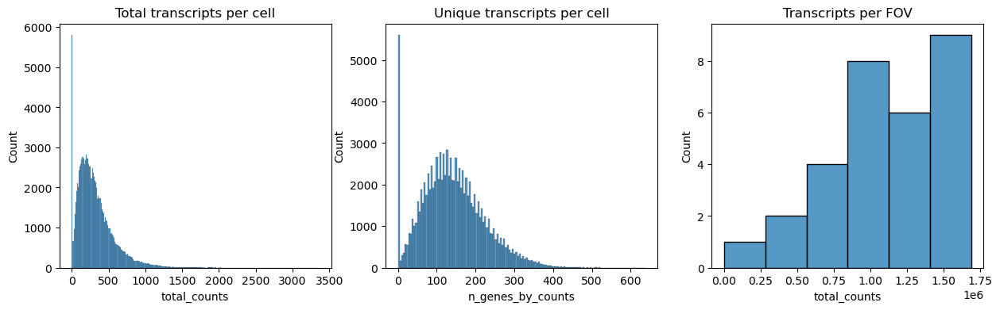

In [17]:
# Next we plot the distribution of total transcripts per cell, unique transcripts per cell and transcripts per FOV
fig, axs = plt.subplots(1, 3, figsize=(15,4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)

axs[2].set_title("Transcripts per FOV")
sns.histplot(
    adata.obs.groupby("fov").sum()["total_counts"],
    kde=False,
    ax=axs[2]
)




<Axes: title={'center': 'CD3'}, xlabel='Mean.CD3', ylabel='Count'>

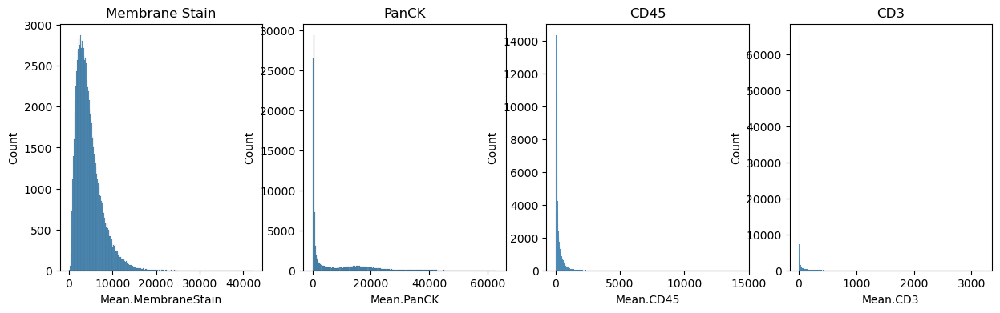

In [9]:
# The dataset also contains immunofluorescence data. It can be read from adata.obs

fig, axs = plt.subplots(1, 4, figsize=(15,4))

axs[0].set_title("Membrane Stain")
sns.histplot(
    adata.obs["Mean.MembraneStain"],
    kde=False,
    ax=axs[0]
)

axs[1].set_title("PanCK")
sns.histplot(
    adata.obs["Mean.PanCK"],
    kde=False,
    ax=axs[1]
)

axs[2].set_title("CD45")
sns.histplot(
    adata.obs["Mean.CD45"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("CD3")
sns.histplot(
    adata.obs["Mean.CD3"],
    kde=False,
    ax=axs[3],
)



Filter the cells based on the minimum number of counts required using `scanpy.pp.filter_cells`. Filter the genes based on the minimum number of cells required with `sc.pp.filter_genes`. The parameters for both were specified based on the plots above.
This filtering is quite conservative, more relaxed settings might also be applicable. Other criteria for filtering cells could be area, immunofluorescence signal or number of unique transcripts.

In [34]:
sc.pp.filter_cells(adata, min_counts=100)
sc.pp.filter_genes(adata, min_cells=400)

In [ ]:
Normalize counts per cell using `sc.pp.normalize_total`
Logarithmize, 
do principal component analysis, 
compute a neighborhood graph of the observations using scanpy.pp.log1p, scanpy.pp.pca and scanpy.pp.neighbors respectively.

Use scanpy.tl.umap to embed the neighborhood graph of the data and cluster the cells into subgroups employing scanpy.tl.leiden.

You may have to install scikit-misc package for highly variable genes identification.

Tools like cell2location requires raw/non-lognormalized data, should be integer format. So better to use filtered data to remove some low-quality, doublets, and mt%.

In [21]:
adata.X.min()

np.float32(0.0)

In [35]:
adata.layers["counts"] = adata.X.copy() # store real raw

sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

adata.raw = adata.copy()

sc.pp.pca(adata)
sc.pp.neighbors(adata)

sc.tl.umap(adata)
sc.tl.leiden(adata)




/tmp/ipykernel_145014/3276496302.py:12: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


## Visualize annotation on UMAP and spatial coordinates
Subplot with scatter plot in UMAP (Uniform Manifold Approximation and Projection) basis. The embedded points were colored, respectively, according to the total counts, number of genes by counts and leiden clusters in each of the subplots. This gives us some idea of what the data looks like.

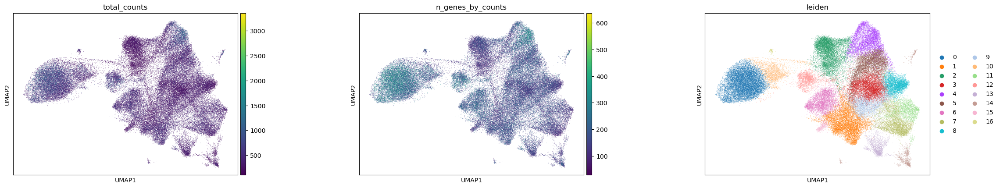

In [39]:
sc.pl.umap(
    adata,
    color = [
        "total_counts",
        "n_genes_by_counts",
        "leiden",
    ],
    wspace = 0.4
)

Plot segmentation masks using squidpy.pl.spatial_segment. Specifically, the key library_id in adata.obs contains the same unique values contained in adata.uns["spatial"]. The "cell_ID" column is used to spot individual cells. Here, the images were colored in accordance with the intensity of the maximum pan-cytokeratin (CK) staining.

/tmp/ipykernel_145014/1015527125.py:10: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  axes = sc.pl.spatial(


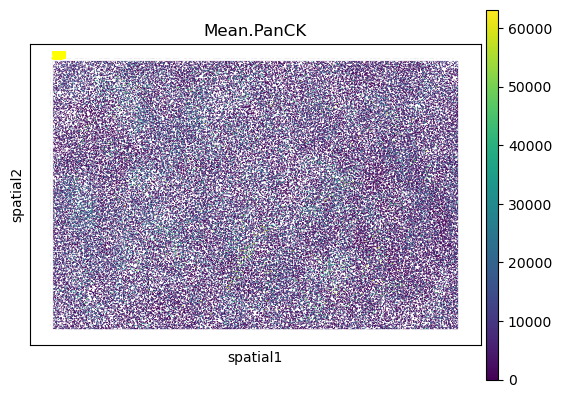

In [38]:
# This is not part of the standard analysis, just for learning. Plot stitched FOVs. The whole picture. 
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import scanpy as sc

# 1. Get the first library ID as a string
lib_id = list(adata.uns['spatial'].keys())[0]

# 2. Plot - notice the [0] at the end of the call
# We force it to return a list and then grab the first (and only) axis
axes = sc.pl.spatial(
    adata, 
    color='Mean.PanCK', 
    library_id=lib_id, 
    img_key=None, 
    show=False, 
    spot_size=15
)

# Scanpy returns a list if multiple colors are plotted, 
# or sometimes by default in newer versions.
ax = axes[0] if isinstance(axes, list) else axes

# 3. Loop through each FOV and draw the boxes
for fov_id in adata.obs['fov'].unique():
    fov_coords = adata.obsm['spatial'][adata.obs['fov'] == fov_id]
    
    xmin, ymin = fov_coords.min(axis=0)
    xmax, ymax = fov_coords.max(axis=0)
    
    rect = patches.Rectangle(
        (xmin, ymin), xmax - xmin, ymax - ymin,
        linewidth=1, edgecolor='white', facecolor='none', alpha=0.4
    )
    
    ax.add_patch(rect)
    ax.text(xmin, ymin, str(fov_id), color='yellow', fontsize=8, weight='bold')

plt.show()



In [80]:
#help(sq.pl.spatial_segment)
adata0 = adata.copy()

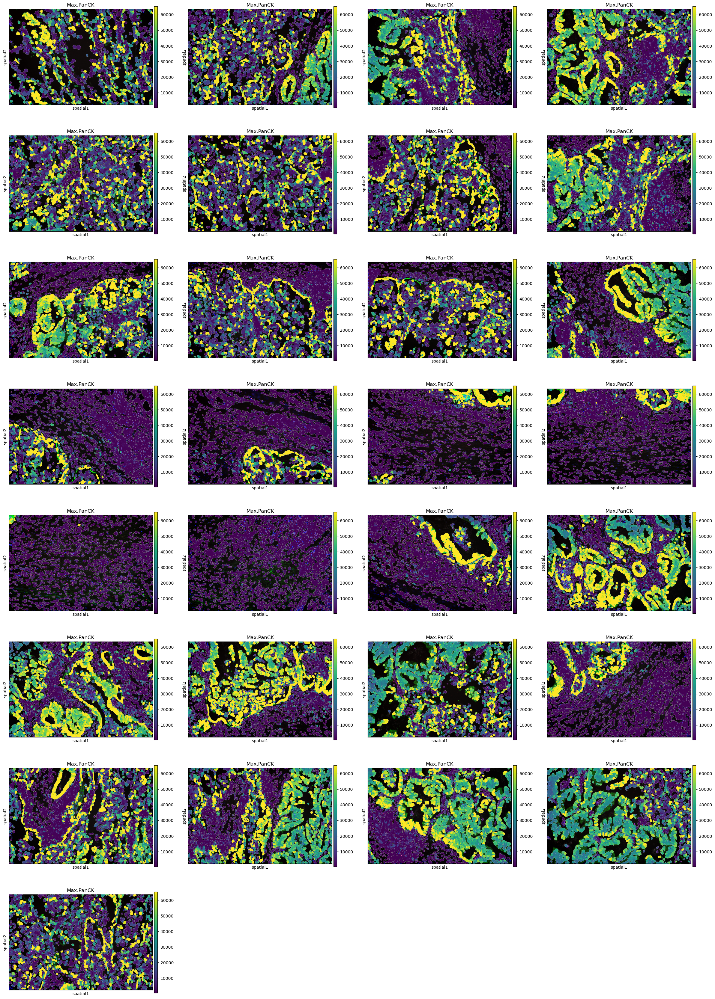

In [28]:
sq.pl.spatial_segment(
    adata,
    color = "Max.PanCK",
    library_key="fov",
    seg_cell_id = "cell_ID"
)

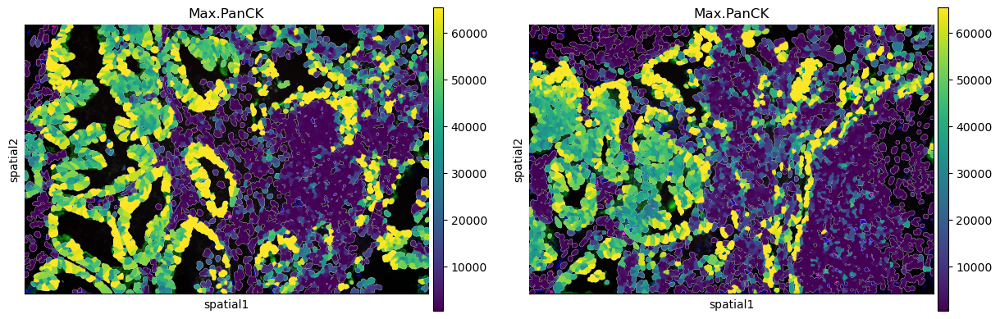

In [29]:
sq.pl.spatial_segment(
    adata,
    color = "Max.PanCK",
    library_key="fov",
    library_id=["12", "16"],
    seg_cell_id="cell_ID",
)

/home/lchen/miniconda3/envs/squidpy/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:724: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  val_im[val_im == erosion(val_im, square(seg_erosionpx))] = 0


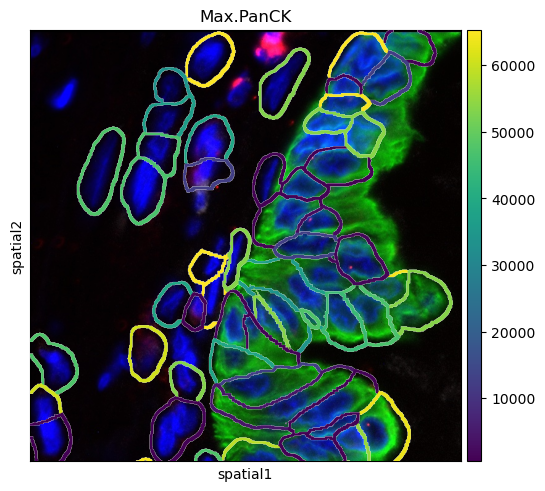

In [33]:
sq.pl.spatial_segment(
    adata,
    color = "Max.PanCK",
    library_key = "fov",
    library_id = "12",
    seg_cell_id = "cell_ID",
    seg_contourpx=10, # cell boundary thin or fat 
    crop_coord=[(0,0,700,700)]
)

If groups of observations are plotted (as above), it’s possible to modify whether to “visualize” the segmentation masks that do not belong to any selected group. It is set as “transparent” by default (see above) but in cases where e.g. no image is present it can be useful to visualize them nonetheless.

A scale bar can also be added, where size and pixel units must be passed. The sizes of the scalebars for these examples are not real values and are purely for visualization purposes.

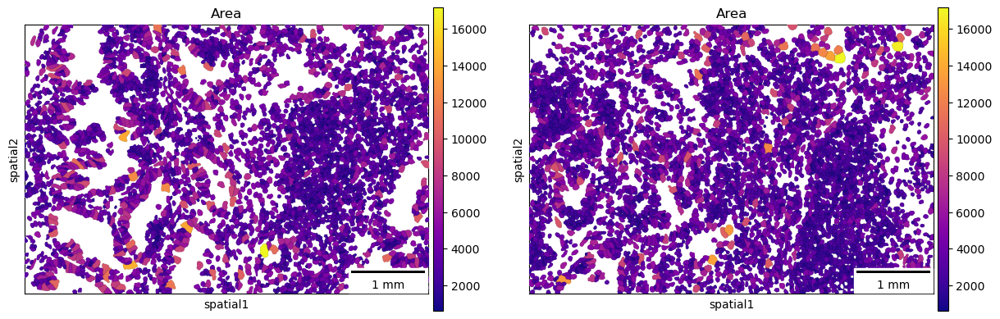

In [34]:
sq.pl.spatial_segment(
    adata,
    color = "Area",
    library_key = "fov",
    library_id = ["12", "16"],
    seg_cell_id = "cell_ID",
    seg_outline=True,
    cmap="plasma",
    img=False,
    scalebar_dx=1.0,
    scalebar_kwargs={"scale_loc": "bottom", "location":"lower right"},
)

Plot the image, with an overlay of the Leiden clusters. Use squidpy.pl.spatial_segment for the same. The image is not visualized by specifying img=False.

One or multiple groups can also be used to overlay, by specifying the groups argument in squidpy.pl.spatial_segment as shown in the second subplot.

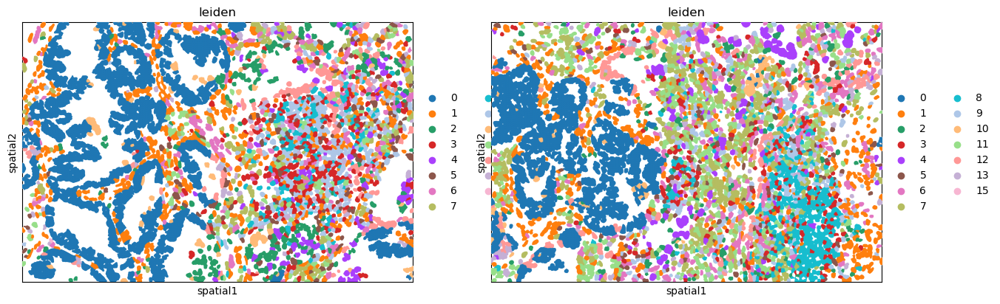

In [35]:
fig, ax = plt.subplots(1,2, figsize=(15,7))
sq.pl.spatial_segment(
    adata,
    shape="hex",
    color = "leiden",
    library_key="fov",
    library_id="12",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[0],
)

sq.pl.spatial_segment(
    adata,
    color="leiden",
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="16",
    img=False,
    size=60,
    ax=ax[1],
)




In [31]:
adata

AnnData object with n_obs × n_vars = 89246 × 980
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_counts', 'leiden'
    var: 'NegPrb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'spatial_fov', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [84]:
print(type(adata.raw.var.index._values))
print(type(adata.var.index._values))

# Starting with AnnData < 0.11, writing pd.arrays.StringArray (Arrow-backed or nullable string arrays) is opt-in, because it’s new and may break compatibility.
# You can tell AnnData it’s okay to write these arrays:

import anndata as ad

# Allow writing pd.StringArray / nullable strings
ad.settings.allow_write_nullable_strings = True

outdir = "/stomics_data/liminData/spatial_biology/CosMx_nanoString/processed_data"
# adata.write_h5ad(f"{outdir}/clustered.h5ad")





# Computation of spatial statistics

Spatial graph is a graph of spatial neighbors with observations as nodes and neighborhood relations between observations as edges. We use spatial coordinates of spots/cells to identify neighbors among them. Different approaches of defining a neighborhood relation among observations are used for different types of spatial datasets. We use `squidpy.gr.spatial_neighbors` to compute the spatial neighbors graph. We use this function for a non-grid dataset with `coord_type = 'generic'`.

Depending on the `coord_type`, `n_neighs` specifies the number of neighboring tiles if `coord_type='grid'` and when the `coord_type` is not a grid, `n_neighs` represents the number of neighborhoods. Moreover, `radius` is only available when `coord_type='generic'`.

Alternatively, `delaunay = True` can be used, for a Delaunay triangulation graph. This way, we can observe the difference in using K-nearest neighbors and Delaunay triangulation. You can appreciate that the neighbor graph is different than before.

/home/lchen/miniconda3/envs/squidpy/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"{value_to_plot}_colors"] = colors_list
/home/lchen/miniconda3/envs/squidpy/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"{value_to_plot}_colors"] = colors_list


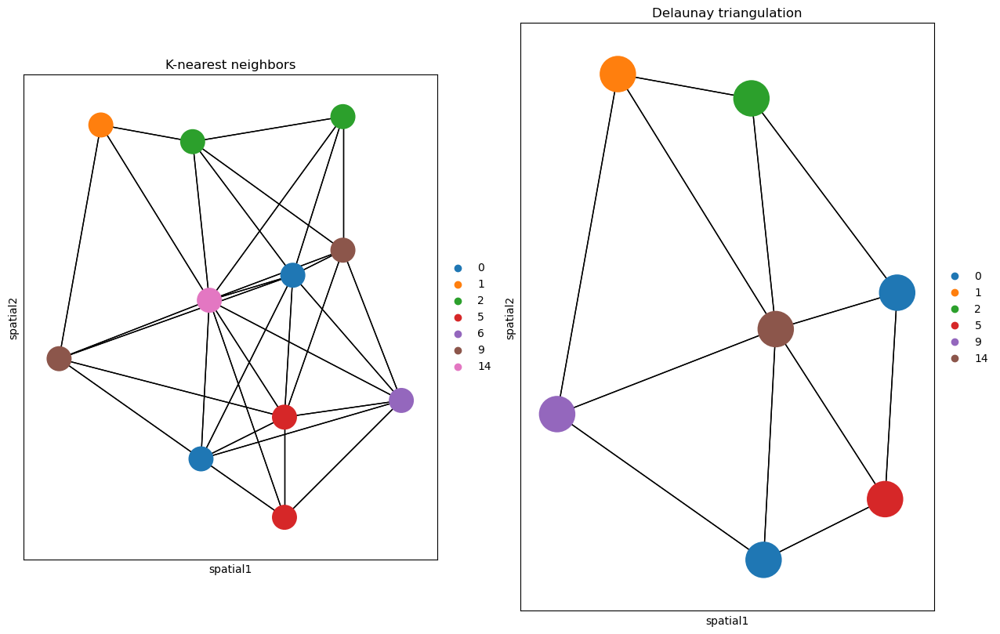

In [98]:
fig, ax = plt.subplots(1, 2, figsize=(15,15))

sq.gr.spatial_neighbors(
    adata,
    n_neighs=10,
    coord_type="generic",
)

_, idx = adata.obsp["spatial_connectivities"][420, :].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="16",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
    title="K-nearest neighbors",
    ax=ax[0]
)

sq.gr.spatial_neighbors(
    adata,
    n_neighs=10,
    coord_type="generic",
    delaunay=True,
)

_, idx = adata.obsp["spatial_connectivities"][420,:].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx,:],
    library_id="16",
    color = "leiden",
    connectivity_key = "spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
    title="Delaunay triangulation",
    ax=ax[1]
)



/home/lchen/miniconda3/envs/squidpy/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"{value_to_plot}_colors"] = colors_list


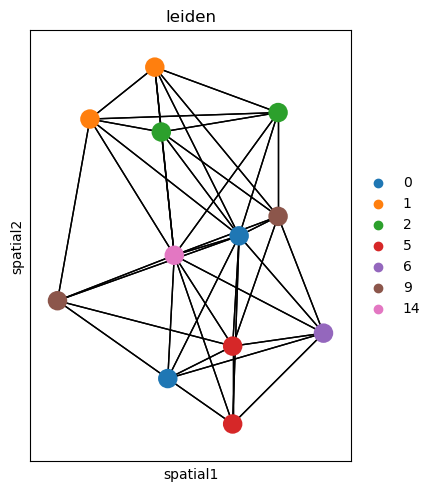

In [99]:
# In order to get all spots within a specified radius (in units of the spatial coordinates) from each spot as neighbors, the parameter `radius` should be used. We can observe how this plot is unlike the above one.
sq.gr.spatial_neighbors(
    adata,
    radius=30,
    coord_type="generic",
)

_,idx = adata.obsp["spatial_connectivities"][420,:].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="16",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
)





# Comput centrality scores

This example shows how to compute centrality scores, given a spatial graph and cell type annotation.


The scores calculated are closeness centrality, degree centrality and clustering coefficient with the following properties:
closeness centrality - measure of how close the group is to other nodes.
clustering coefficient - measure of the degree to which nodes cluster together.
degree centrality - fraction of non-group members connected to group members.



All scores are descriptive statistics of the spatial graph.

This dataset contains Leiden cluster groups’ annotations in anndata.AnnData.obs, which are used for calculation of centrality scores.

First, we need to compute a connectivity matrix from spatial coordinates to calculate the centrality scores. We can use squidpy.gr.spatial_neighbors for this purpose. We use the coord_type="generic" based on the data and the neighbors are classified with Delaunay triangulation by specifying delaunay=True.



ERROR: Unable to fetch palette, reason: 'leiden_colors'. Using `None`.


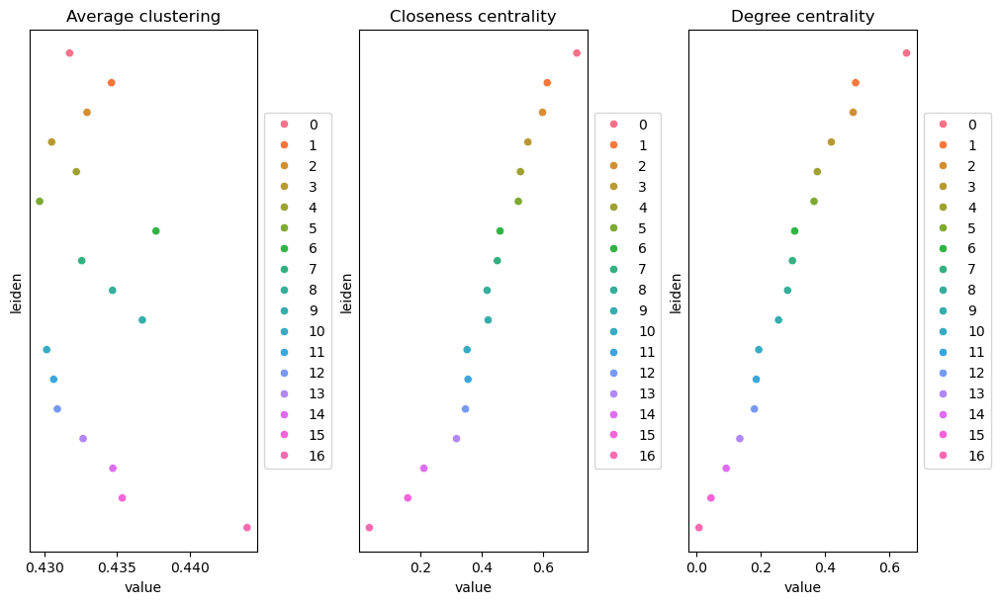

In [100]:
adata_spatial_neighbor = sq.gr.spatial_neighbors(
    adata, coord_type="generic", delaunay=True
)

#Centrality scores are calculated with squidpy.gr.centrality_scores, with the Leiden clusters.
sq.gr.centrality_scores(adata, cluster_key="leiden")

# The results were visualized by plotting the average centrality, closeness centrality, and degree centrality using squidpy.pl.centrality_scores.
sq.pl.centrality_scores(adata, cluster_key="leiden", figsize=(10,6))



These plots analyze your spatial data as a graph (network). In this context, each spot is a "node," and its physical neighbors are "edges." These metrics describe how social or influential each Leiden cluster is within that tissue network.
1. Degree Centrality (Right)
 Definition: Measures how many immediate neighbors a spot has on average for a given cluster.
 Interpretation: Clusters at the top (like 0, 1, 2) have the highest connectivity.
  Biological Meaning: These cells are likely in dense, packed regions (like the center of a tumor or a solid tissue layer).
  Low Scores (bottom): Clusters like 16 are likely at the tissue edge or are very sparse, meaning they have fewer neighbors to connect with.
2. Closeness Centrality (Middle)
 Definition: Measures how "centrally located" a cluster is relative to all other spots in the entire sample. It calculates the shortest path from one cluster to all others.
 Interpretation: High scores (top) mean the cluster is in the geographic heart of the tissue.
  Biological Meaning: Cluster 0 is likely the "hub" or central core of your sample. You can reach any other part of the tissue fastest starting from here.
  Low Scores: Cluster 16 is physically isolated or tucked away in a far corner (the periphery).
3. Average Clustering (Left)
 Definition: Measures how well the neighbors of a spot are also neighbors of each other (forming "triangles").
 Interpretation: This measures local density and uniformity.
  High Scores (Cluster 16): Even though Cluster 16 is at the edge (low degree), its members are very tightly knit with each other. It forms a very cohesive, exclusive community.
  Low Scores (Clusters 4, 5, 11): These clusters are more "strung out" or irregular. Their neighbors aren't necessarily connected to each other, suggesting a more dendritic or branching shape (like infiltrating immune cells or vessels).

Summary Table for your Clusters
Metric	     High_Value_Means...	           Your Top Cluster
Degree	     More neighbors (Dense/Packed)    	0
Closeness	 Geographically central	            0
Clustering	 Tight-knit local "cliques"	        16

The Takeaway: Cluster 0 is the "Main Street" of your tissue—central and highly connected. Cluster 16 is a "Gated Community"—physically isolated at the edge, but very tightly packed internally.


# Compute co-occurrence probability

This example shows how to compute the co-occurrence probability.

While Ripley’s functions (which we discussed earlier) look at how a single cluster is distributed, this plot looks at the relationship between two things. 

The co-occurrence score is defined as: 𝑝⁡(𝑒⁢𝑥⁢𝑝|𝑐⁢𝑜⁢𝑛⁢𝑑)/𝑝⁡(𝑒⁢𝑥⁢𝑝)

where 𝑝⁡(𝑒⁢𝑥⁢𝑝|𝑐⁢𝑜⁢𝑛⁢𝑑) is the conditional probability of observing a cluster 𝑒𝑥𝑝 conditioned on the presence of a cluster 𝑐⁢𝑜⁢𝑛⁢𝑑, whereas 𝑝⁡(𝑒⁢𝑥⁢𝑝) is the probability of observing 𝑒𝑥𝑝 in the radius size of interest. The score is computed across increasing radii size around each cell in the tissue.

Specifically, it asks: "If I am standing at a spot belonging to Cluster 3, how likely am I to find other clusters at distance X?"
The formula: p(exp|3)/p(exp)
p(exp|3): The probability of finding a specific cluster (the "exp" or experimental cluster) at a certain distance, given that we are starting from Cluster 3.
p(exp): The general "background" probability of finding that cluster anywhere on the slide.
The Ratio:
value=1.0: Random. Being near Cluster 3 doesn't change your chances of seeing the other cluster.
value > 1.0: Enrichment. These clusters are "neighbors". You are more likely to find them near cluster3 than anywhere else.
value < 1.0: Depletion/Exclusion. These clusters "avoid" cluster3. They are likely in different anatomical regions.


We can compute the co-occurrence score with `squidpy.gr.co_occurrence`. Results of co-occurrence probability ratio can be visualized with `squidpy.pl.co_occurrence`. The ‘3’ in the 𝑝⁡(𝑒⁢𝑥⁢𝑝|𝑐⁢𝑜⁢𝑛⁢𝑑)/𝑝⁡(𝑒⁢𝑥⁢𝑝) represents a Leiden clustered group.


In [101]:
adata_subset = adata[adata.obs.fov == "16"].copy()

ERROR: Unable to fetch palette, reason: 'leiden_colors'. Using `None`.


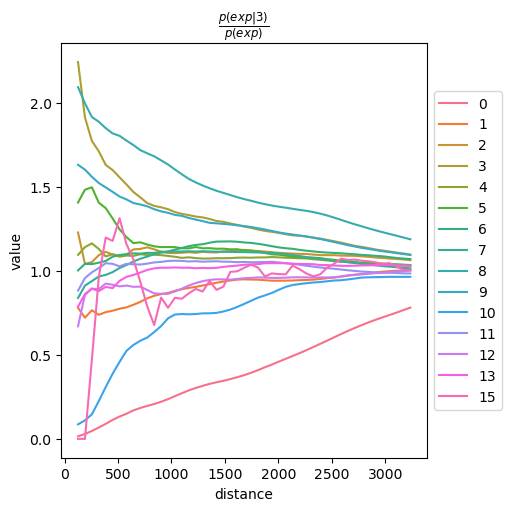

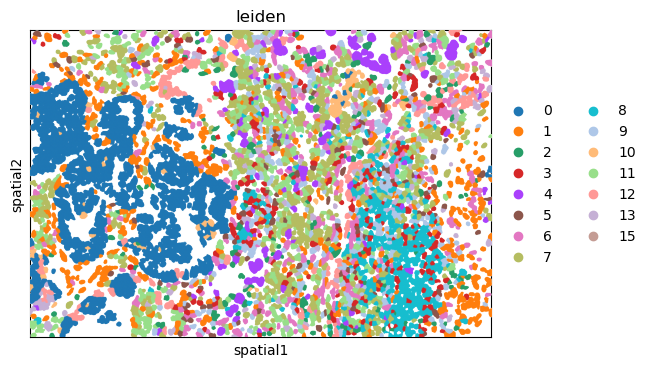

In [102]:
# We can further visualize tissue organization in spatial coordinates with squidpy.pl.spatial_segment, with an overlay of the expressed genes which were colored in consonance with the Leiden clusters.

sq.gr.co_occurrence(
    adata_subset,
    cluster_key="leiden"    
)


sq.pl.co_occurrence(
    adata_subset,
    cluster_key="leiden",
    clusters="3"
)

sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60
)


# Neighbor enrichment analysis
This example shows how to run the neighbors enrichment analysis routine.

It calculates an enrichment score based on proximity on the connectivity graph of cell clusters. The number of observed events is compared against 𝑁 permutations and a z-score is computed.

This dataset contains cell type annotations in `anndata.Anndata.obs` which are used for calculation of the neighborhood enrichment. We calculate the neighborhood enrichment score with `squidpy.gr.nhood_enrichment`.

In [105]:
sq.gr.nhood_enrichment(adata, cluster_key="leiden")

# The same can be done for a specific FOV, by creating a subset of the `anndata.AnnData`.

sq.gr.nhood_enrichment(adata_subset, cluster_key="leiden")



100%|██████████| 1000/1000 [00:00<00:00, 1140.96/s]
/home/lchen/miniconda3/envs/squidpy/lib/python3.11/site-packages/squidpy/gr/_nhood.py:217: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


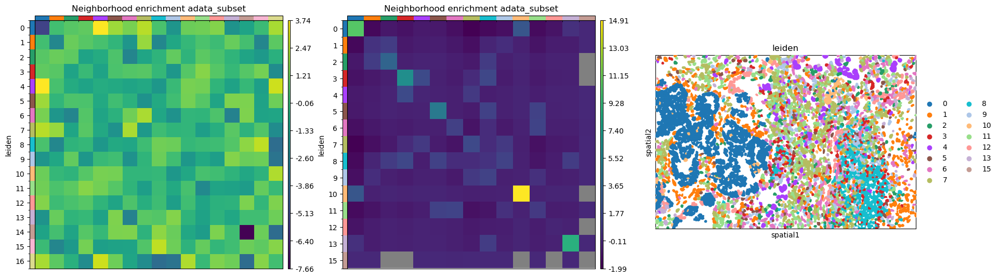

In [108]:
# And visualize the results with `squidpy.pl.nhood_enrichment`.
fig, ax = plt.subplots(1, 3, figsize=(22, 22))

sq.pl.nhood_enrichment(
    adata,
    cluster_key="leiden",
    figsize=(3,3),
    ax=ax[0],
    title="Neighborhood enrichment adata_subset",
)

sq.pl.nhood_enrichment(
    adata_subset,
    cluster_key="leiden",
    figsize=(3,3),
    ax=ax[1],
    title="Neighborhood enrichment adata_subset",
)

sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[2],
)




# Compute Ripley's statistics
This example shows how to compute the Ripley’s L function.
The Ripley’s L function is a descriptive statistics generally used to determine whether points have a random, dispersed or clustered distribution pattern at certain scale. The Ripley’s L is a variance-normalized version of the Ripley’s K statistic. There are also 2 other Ripley’s statistics available (that are closely related): ‘G’ and ‘F’.

This cannot be used to evaluate if your transcript-based cluster results is good or not. 

Ripley’s G monitors the portion of points for which the nearest neighbor is within a given distance threshold, and plots that cumulative percentage against the increasing distance radii.

For increasing separation range, Ripley’s F function assembles the percentage of points which can be found in the aforementioned range from an arbitrary point pattern spawned in the expanse of the noticed pattern.

We can compute the Ripley’s L function with `squidpy.gr.ripley`. Results can be visualized with squidpy.pl.ripley. The same was plotted for `adata_subset`. Other Ripley’s statistics can be specified using `mode = 'G'` or `mode = 'F'`.

Note: 

In the context of Ripley's results, the "cluster" is not the same as "cluster" from transcriptomics UMI clusters results. Ripley is blind to gene expression data. In spatial statistics (not spatial biology), clustering means spatial pattern. "clustered" doesn't necessarily mean all cells are in one giant pile in the middle of the slide. It means spatial preference.

The Gray Line (CSR): The thick gray/shaded line represents Complete Spatial Randomness (CSR). This is your null hypothesis (What a random distribution look like.) That line represents a "Permutation Test" where the computer took all your cells and "shook them up" like a snowglobe to see what a random distribution would look like.

    1. The Gap is the P-Value: the vertical distance between a colored line and the gray line tells you how "non-random" the pattern is.
    2. The Verdict: Because if every single colored line is separated from that gray line (non of them are touching it or crossing into it), the probability that these patterns happened by accident is effectively zero.
In a paper, you would report this as: "All identified cell niches exhibited significant spatial clustering (p < 0.01) across all investigated distance bins "

Ripley's functions DO NOT "see" the gene expression values (the counts or UMI levels) within the cluster. They only see the locations where that cluster exists.

Because Visium/stereo-seq technology are all fixed grid. Run Riley's functions on these grid themselves, the results would be boring (perfectly regular/dispersed). To apply these function in spatial transcriptomics field, instead of analyzing all spots, you only analyze the coordinates of spots of a given celltype or cluster. If those specific spots of the given celltype "clump" together on the grid, Ripley's L curve will go above the gry line, indicating that the gene expression is spatially clustered, even if the underlying grid is uniform.


In spatial analysis (and squidpy workflows), you'll often see K, L, G, and F functions grouped together. While they all use coordinates to describe spatial patterns, they look at those coordinates through different "lenses."
Here is how they differ from the basic Ripley's K:
1. Ripley’s L (The "Cleaned Up" K)
Ripley’s L is essentially a normalized version of Ripley’s K. 

The Difference: The standard K-function grows quadratically (πr2) as distance increases, which makes it hard to read on a plot. The L-function transforms the curve so that Complete Spatial Randomness (CSR) is a flat horizontal line at 0.
Why use it: It makes it much easier to see exactly where your data deviates from random. If the line is above 0, it’s clustered; if it’s below, it’s dispersed. 
Ripley’s L looks at all neighbors within a certain distance (density).

2. G-Function (Nearest Neighbor Distance)
While Ripley’s K counts all neighbors within a radius, the G-function only cares about the nearest neighbor for each point. 

The Difference: It measures the distribution of the distance to the very next closest spot.
Why use it: It is much more sensitive to "small-scale" clustering. If you have tight, small micro-clusters that are far apart from each other, the G-function will spike quickly at short distances, whereas the K-function might look "random" because it averages out the big empty spaces between those clusters. 

3. F-Function (Empty Space Function)
The F-function is the "opposite" of the G-function. Instead of starting at a cell and looking for its neighbor, you pick a random empty point on the grid and measure the distance to the nearest cell. 

The Difference: It measures the "gaps" or "empty spaces" in your data.
Why use it: It's great for detecting if your cells are avoiding certain areas (like a "hole" in the tissue) or if they are filling the space uniformly.

Summary Comparison Table
Function 	What it measures	                        Sensitivity	Best for...
K	        Number of neighbors within distance         Multi-scale	General clustering over distance.
L	        Normalized K(L(r)=r for random)	            Multi-scale	Easy visual interpretation of K.
G	        Distance to the nearest neighbor	        Short-range	Finding tight, local clusters.
F	        Distance from empty space to nearest point	Empty space	Identifying "voids" or non-random gaps.

If you ran these functions on the raw Visium/Stereo-seq grid, the results would be boring (perfectly regular/dispersed).
To make these functions meaningful, you have to filter the coordinates based on your biological data. You aren't analyzing the grid; you are analyzing the pattern of "on" vs "off" pixels.
Here is how you actually use them in a workflow:
1. Select a Subset: You pick only the spots belonging to Cluster 5 (e.g., T-cells).
2. Extract Coordinates: You take the (x,y) of only those specific spots.
3. Run Ripley: The function now looks at the "constellation" formed by Cluster 5.
    Clustered: If Cluster 5 spots are grouped in the top-right corner, the curve goes above the line.
    Random: If Cluster 5 spots are scattered like salt and pepper across the whole grid, the curve stays near the grey line.
    Dispersed: If Cluster 5 spots are perfectly spaced out (never touching each other), the curve goes below the line.


Why this is better than just looking at a cluster map:
A cluster map looks clustered to your eyes, but Ripley's quantifies it. It tells you:
    Scale: Are they clustered at a "short-range" (direct contact) or "long-range" (neighborhood)?
    Significance: Is this cluster tighter than what you'd get if you just randomly assigned the label "Cluster 5" to any spot on the slide?
The Logic: You use the biological cluster labels to choose which coordinates to feed into the function. The "coordinates themselves" are just the stage; your gene expression/clusters are the actors whose movement you are tracking.


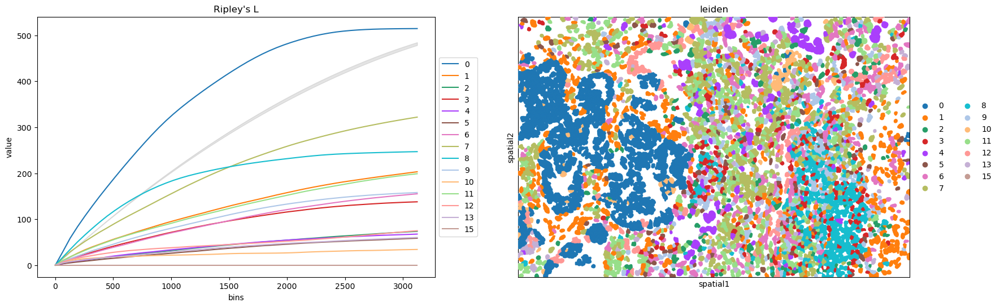

In [109]:
mode = "L"
fig, ax = plt.subplots(1, 2, figsize=(20, 6))

sq.gr.ripley(adata_subset, cluster_key="leiden", mode=mode)
sq.pl.ripley(
    adata_subset,
    cluster_key="leiden",
    mode=mode,
    ax=ax[0],
)

sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="16",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[1],
)

In [112]:
print(type(adata_subset.var_names))
print(len(adata_subset.var_names))
print(adata_subset.raw is None)

<class 'pandas.Index'>
980
False


# Compute Moran's I score.
Not like Ripley's functions looking at clusters of points, Moran's I is looking at the intensity of gene expression.
This example shows how to compute the Moran’s I global spatial auto-correlation statistics.

The Moran's I global spatial auto_correlation statistics evaluates whether features (i.e. genes) shows a pattern that is clustered, dispered or random in the tissue are under consideration.

We can compute the Moran's I score with `squidpy.gr.spatial_autocorr` and `mode = 'moran'`. We first need to compute a spatial graph with `squidpy.gr.spatial_neighbors`. We will also subset the number of genes to evaluate.





In [113]:
sq.gr.spatial_neighbors(adata_subset, coord_type="generic", delaunay=True)
sq.gr.spatial_autocorr(
    adata_subset,
    genes=adata_subset.var_names,
    mode="moran",
    n_perms=100,
    n_jobs=1,
)
adata_subset.uns["moranI"].head(10)

100%|██████████| 100/100 [01:12<00:00,  1.37/s]


,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
KRT19,0.774879,0.0,0.000076,0.0,0.009901,0.000151,0.0,0.0,0.019214
OLFM4,0.752305,0.0,0.000076,0.0,0.009901,0.000173,0.0,0.0,0.019214
CEACAM6,0.749981,0.0,0.000076,0.0,0.009901,0.000158,0.0,0.0,0.019214
KRT17,0.665890,0.0,0.000076,0.0,0.009901,0.000135,0.0,0.0,0.019214
S100A6,0.624956,0.0,0.000076,0.0,0.009901,0.000147,0.0,0.0,0.019214
TM4SF1,0.586031,0.0,0.000076,0.0,0.009901,0.000166,0.0,0.0,0.019214
EPCAM,0.556131,0.0,0.000076,0.0,0.009901,0.000124,0.0,0.0,0.019214
KRT8,0.528026,0.0,0.000076,0.0,0.009901,0.000139,0.0,0.0,0.019214
ANXA2,0.511835,0.0,0.000076,0.0,0.009901,0.000134,0.0,0.0,0.019214
PIGR,0.498941,0.0,0.000076,0.0,0.009901,0.000108,0.0,0.0,0.019214


 The Gene Name & I (Moran’s I Index)
Column I: This is the most value. It ranges from -1 to +1.
Positive values (ex, 0.5 to 0.77): All these genes show strong Spatial Autocorrelation. This means spots with high expression of KRT19 or OLFM4 are physically located next to other spots with high expression. They form clear, "hot-spot" patterns on your tissue slide.

The Ranking: KRT19 is your most spatially structured gene (I=0.77), while PIGR is slightly less so (I=0.49), though still highly clustered.

In spatial statistics (specifically when calculating Moran’s I), we need a "Null Hypothesis" to compare your data against. These three p-values represent different ways of calculating how likely it is that your gene's spatial pattern happened by pure chance.

1. pval_norm (Analytical/Normal Approximation)
How it's calculated: It assumes that if the gene expression were random, the resulting Moran’s I values would follow a perfect Normal Distribution (a bell curve).
When to use it: It is the fastest to calculate. However, it can be slightly inaccurate if your data is very skewed or has many "zero" expression spots (common in single-cell and ST data).

2. pval_sim (Permutation/Simulation)
How it's calculated: The computer physically "shuffles" your gene expression values across the spots thousands of times (Monte Carlo permutations). For each shuffle, it calculates a "fake" Moran’s I.
Interpretation: Your pval_sim of 0.009901 is the lowest possible value for 100 simulations (1/(100+1)). It means that in 100 random shuffles, zero of them were as clustered as your real data.
Why it's better: It doesn't make assumptions about bell curves; it uses your actual data points.

3. pval_z_sim(Z-score based on Simulation)
How it's calculated: This is a "hybrid" approach. The computer shuffles the data (like in pval_sim), but then it calculates the Z-score (how many standard deviations your real 
 is away from the average of the shuffles). It then converts that Z-score back into a p-value using a normal distribution.
Interpretation: It provides a much more "granular" p-value than pval_sim. While pval_sim is limited by how many times you shuffle (e.g., you can't get lower than 0.001 with 1,000 shuffles), pval_z_sim can give you extremely small numbers like 0.0000001.


Know the Variance measures the "spread" of the null model (what randomness looks like), while FDR is a correction to ensure your results aren't just statistical flukes.
1. var_norm vs. var_sim (The "Baseline" Variance)
These columns tell the computer how much the Moran's I value is expected to "wiggle" if the gene expression were truly random.

var_norm (Analytical): This is calculated using a mathematical formula based on the total number of spots and their connections. It measures a perfect theoretical distribution.

var_sim (Empirical): This is calculated by actually shuffling your data (permutations) many times and measuring the variance of those shuffled results.

Why they matter: If var_sim is much larger than var_norm, it means your data has a weird shape (like lots of zeros) that the standard formula doesn't account for. In your table, they are very similar (0.000076 vs 0.000193), which means your data is well-behaved.

2. The `fdr_bh` Columns (The "Reality Check")
Spatial transcriptomics, you are testing thousands of genes at once. If you use a standard p-value of 0.05, you might find 50 "significant" genes just by pure luck. FDR (False Discovery Rate) via the Benjaminin-Hochberg (BH) method fixes this.
`pval_norm_fdr_bh`: The adjusted version of the theoretical p-value.
`pval_z_sim_fdr_bh`: The adjusted version of the Z-score p-value.
`pval_sim_fdr_bh`: The adjusted version of the permutation p-value.

How to interpret them:
If the value is < 0.05: The gene is "Spatially Variable" (SV).
In your table (0.0 and 0.019): Even after the strictest corrections, these genes are all highly sighnificant. The 0.01929 in the last column is actually 2/101 (adjusted for the number of genes tested), which is the most "honest" p-value you can report.

Summary Comparison Table
Column	Purpose	                      Simple_Translation
var_...	Technical_Baseline	         "How much does a random pattern fluctuate?"
fdr_bh	Multiple_Testing_Correction	  "Is this gene actually spatial, or did I just get lucky because I tested 20,000 genes?"

Pro-tip: When writing your methods or figure legends, usually the pval_sim_fdr_bh is the one most reviewers want to see, as it is the most "data-driven" and conservative estimate.

Which one should you trust?
In most Spatial Transcriptomics papers:
pval_sim_fdr_bh (the simulated p-value corrected for multiple testing) is considered the most robust because it doesn't assume your data is "normal."
pval_z_sim_fdr_bh is often used when you need to rank genes that all have the same "zero" p-value in the other columns, as it allows for finer differentiation.



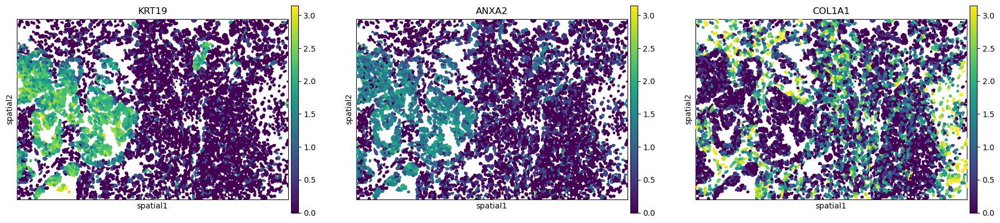

In [114]:
sq.pl.spatial_segment(
    adata_subset,
    library_id="16",
    seg_cell_id="cell_ID",
    library_key="fov",
    color=["KRT19", "ANXA2", "COL1A1"],
    size=60,
    img=False,
)